# `EmissionAbsorptionModel` Constant Column Density Bias

Trey V. Wenger (c) July 2025

The default behavior of `EmissionAbsorptionModel` is to assume that the column density probed by absorption is *identical* to the column density probed by emission. This is the behavior when `prior_sigma_log10_NHI` is `None` (the default).

Here we demonstrate the bias imposed by assuming `prior_sigma_log10_NHI = None`.

In [1]:
# General imports    
import time

import matplotlib.pyplot as plt
import arviz as az
import pandas as pd
import numpy as np
import pymc as pm

print("pymc version:", pm.__version__)
print("arviz version:", az.__version__)

import bayes_spec
print("bayes_spec version:", bayes_spec.__version__)

import caribou_hi
print("caribou_hi version:", caribou_hi.__version__)

# Notebook configuration
pd.options.display.max_rows = None

pymc version: 5.22.0
arviz version: 0.22.0dev
bayes_spec version: 1.9.0
caribou_hi version: 4.1.0+3.g94a913e.dirty


## Simulating Data

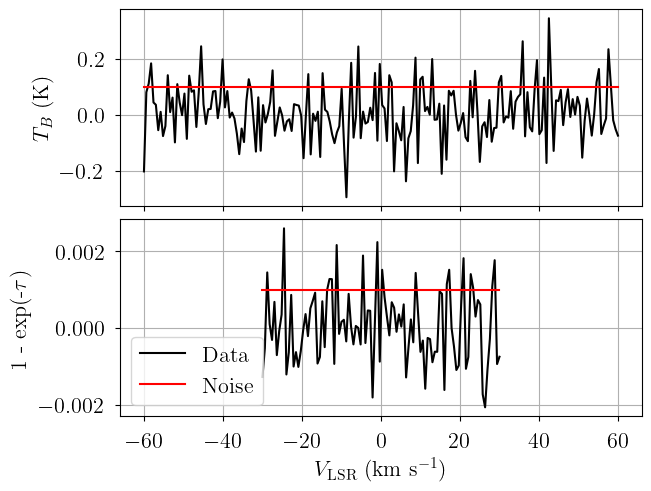

In [2]:
from bayes_spec import SpecData

# spectral axes definitions
emission_axis = np.linspace(-60.0, 60.0, 200)  # km s-1
absorption_axis = np.linspace(-30.0, 30.0, 100)  # km s-1

# data noise can either be a scalar (assumed constant noise across the spectrum)
# or an array of the same length as the data
rms_emission = 0.1  # K
rms_absorption = 0.001  # 1 - exp(-tau)

# brightness data. In this case, we just throw in some random data for now
# since we are only doing this in order to simulate some actual data.
emission = rms_emission * np.random.randn(len(emission_axis))
absorption = rms_absorption * np.random.randn(len(absorption_axis))

dummy_data = {
    "emission": SpecData(
        emission_axis,
        emission,
        rms_emission,
        xlabel=r"$V_{\rm LSR}$ (km s$^{-1}$)",
        ylabel=r"$T_B$ (K)",
    ),
    "absorption": SpecData(
        absorption_axis,
        absorption,
        rms_absorption,
        xlabel=r"$V_{\rm LSR}$ (km s$^{-1}$)",
        ylabel=r"1 - exp(-$\tau$)",
    ),
}

# Plot dummy data
fig, axes = plt.subplots(2, layout="constrained", sharex=True)
axes[0].plot(dummy_data["emission"].spectral, dummy_data["emission"].brightness, "k-")
axes[0].plot(dummy_data["emission"].spectral, dummy_data["emission"].noise, "r-")
axes[1].plot(dummy_data["absorption"].spectral, dummy_data["absorption"].brightness, "k-", label="Data")
axes[1].plot(dummy_data["absorption"].spectral, dummy_data["absorption"].noise, "r-", label="Noise")
axes[1].set_xlabel(dummy_data["emission"].xlabel)
axes[0].set_ylabel(dummy_data["emission"].ylabel)
axes[1].set_ylabel(dummy_data["absorption"].ylabel)
_ = axes[1].legend(loc="lower left")

In [3]:
from caribou_hi import EmissionAbsorptionModel

# Initialize and define the model
n_clouds = 3
baseline_degree = 0
model = EmissionAbsorptionModel(
    dummy_data,
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    bg_temp = 3.77, # assumed background temperature (K)
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_filling_factor=[2.0, 1.0],  # filling factor prior shape
    prior_TB_fwhm=50.0, # peak brightness temperature x FWHM prior width (K km s-1)
    prior_tkin_factor=[2.0, 2.0], # kinetic temperature prior shape
    prior_sigma_log10_NHI=0.5, # log-normal column density distribution width
    prior_fwhm2=200.0, # FWHM^2 prior width (km2 s-2)
    prior_log10_nHI=[0.0, 1.5],  # log10(density) prior mean and width (cm-3)
    prior_velocity=[-15.0, 15.0],  # lower and upper limit of velocity prior (km/s)
    prior_log10_n_alpha=[-6.0, 1.0],  # log10(n_alpha) prior width (cm-3)
    prior_fwhm_L=None,  # Assume Gaussian line profile
    prior_baseline_coeffs=None,  # Default baseline priors
)
model.add_likelihood()

In [4]:
from caribou_hi import physics

# Simulation parameters
filling_factor = np.array([0.2, 0.8, 1.0])
absorption_weight = np.array([0.9, 0.8, 1.0])

log10_nHI = np.array([1.25, 0.0, -0.5])
tkin = np.array([50.0, 300.0, 5000.0])
n_alpha = np.array([1.0e-6, 2.0e-6, 3.0e-6])
depth = np.array([5.0, 25.0, 300.0])
nth_fwhm_1pc = np.array([1.25, 1.75, 1.5])
depth_nth_fwhm_power = np.array([0.2, 0.3, 0.4])

tspin = physics.calc_spin_temp(tkin, 10.0**log10_nHI, n_alpha).eval()
print("tspin", tspin)

fwhm_nonthermal = physics.calc_nonthermal_fwhm(depth, nth_fwhm_1pc, depth_nth_fwhm_power)
fwhm2_thermal = physics.calc_thermal_fwhm2(tkin)
fwhm = np.sqrt(fwhm_nonthermal**2.0 + fwhm2_thermal)
print("fwhm", fwhm)

log10_Pth = np.log10(tkin) + log10_nHI
print("log10_Pth", log10_Pth)

log10_NHI = log10_nHI + np.log10(depth) + 18.489351
print("log10_NHI", log10_NHI)

tau_total = physics.calc_tau_total(10.0**log10_NHI, tspin)
print("tau_total", tau_total)

const = np.sqrt(2.0 * np.pi) / (2.0 * np.sqrt(2.0 * np.log(2.0)))
tau_peak = tau_total / fwhm / const
print("tau_peak", tau_peak)

TB_fwhm = filling_factor * tspin * (1.0 - np.exp(-tau_peak)) * fwhm
print("TB_fwhm", TB_fwhm)

wt_ff_tspin = absorption_weight / filling_factor / tspin
print("wt_ff_tspin", wt_ff_tspin)

sim_params = {
    "TB_fwhm": TB_fwhm,
    "tkin": tkin,
    "filling_factor": filling_factor,
    "wt_ff_tspin": wt_ff_tspin,
    "absorption_weight": absorption_weight,
    "fwhm2": fwhm**2.0,
    "log10_nHI": log10_nHI,
    "velocity": np.array([-5.0, 5.0, 10.0]),
    "n_alpha": n_alpha,
    "baseline_emission_norm": [0.0],
    "baseline_absorption_norm": [0.0],
}

# add derived quantities to sim_params
for key in model.cloud_deterministics:
    if key not in sim_params.keys():
        sim_params[key] = model.model[key].eval(sim_params, on_unused_input="ignore")

# Evaluate and save simulated observation
emission = model.model["emission"].eval(sim_params, on_unused_input="ignore")
absorption = model.model["absorption"].eval(sim_params, on_unused_input="ignore")

data = {
    "emission": SpecData(
        emission_axis,
        emission,
        rms_emission,
        xlabel=r"$V_{\rm LSR}$ (km s$^{-1}$)",
        ylabel=r"$T_B$ (K)",
    ),
    "absorption": SpecData(
        absorption_axis,
        absorption,
        rms_absorption,
        xlabel=r"$V_{\rm LSR}$ (km s$^{-1}$)",
        ylabel=r"1 - exp(-$\tau$)",
    ),
}

tspin [  49.97911226  298.78900835 4259.26982821]
fwhm [ 2.29393108  5.90364916 21.08270953]
log10_Pth [2.94897    2.47712125 3.19897   ]
log10_NHI [20.438321   19.88729101 20.46647225]
tau_total [3.01218479 0.14166923 0.03771258]
tau_peak [1.23358487 0.02254357 0.00168046]
TB_fwhm [ 16.25152201  31.45660514 150.77326269]
wt_ff_tspin [0.09003761 0.00334684 0.00023478]


In [5]:
sim_params

{'TB_fwhm': array([ 16.25152201,  31.45660514, 150.77326269]),
 'tkin': array([  50.,  300., 5000.]),
 'filling_factor': array([0.2, 0.8, 1. ]),
 'wt_ff_tspin': array([0.09003761, 0.00334684, 0.00023478]),
 'absorption_weight': array([0.9, 0.8, 1. ]),
 'fwhm2': array([  5.26211978,  34.85307344, 444.48064099]),
 'log10_nHI': array([ 1.25,  0.  , -0.5 ]),
 'velocity': array([-5.,  5., 10.]),
 'n_alpha': array([1.e-06, 2.e-06, 3.e-06]),
 'baseline_emission_norm': [0.0],
 'baseline_absorption_norm': [0.0],
 'log10_n_alpha': array([-5.39682159, -5.98007026, -5.53006719]),
 'tspin': array([  49.99361181,  297.82829201, 4250.13330217]),
 'tau_total': array([3.01046199, 0.14213143, 0.03779372]),
 'log10_Pth': array([2.94897   , 2.47712125, 3.19897   ]),
 'log10_NHI': array([20.43819852, 19.88730692, 20.46647304]),
 'log10_depth': array([0.69884752, 1.39795592, 2.47712204])}

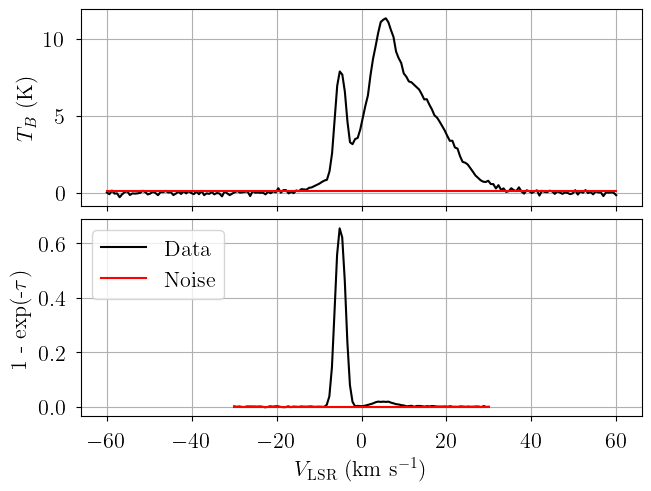

In [6]:
# Plot data
fig, axes = plt.subplots(2, layout="constrained", sharex=True)
axes[0].plot(data["emission"].spectral, data["emission"].brightness, "k-")
axes[0].plot(data["emission"].spectral, data["emission"].noise, "r-")
axes[1].plot(data["absorption"].spectral, data["absorption"].brightness, "k-", label="Data")
axes[1].plot(data["absorption"].spectral, data["absorption"].noise, "r-", label="Noise")
axes[1].set_xlabel(data["emission"].xlabel)
axes[0].set_ylabel(data["emission"].ylabel)
axes[1].set_ylabel(data["absorption"].ylabel)
_ = axes[1].legend(loc="upper left")

## Model Definition

Here we assume `prior_sigma_log10_NHI = None`.

In [16]:
# Initialize and define the model
model = EmissionAbsorptionModel(
    data,
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    bg_temp = 3.77, # assumed background temperature (K)
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_filling_factor=[2.0, 1.0],  # filling factor prior shape
    prior_TB_fwhm=200.0, # peak brightness temperature x FWHM prior width (K km s-1)
    prior_tkin_factor=[2.0, 2.0], # kinetic temperature prior shape
    prior_sigma_log10_NHI=None, 
    prior_fwhm2=200.0, # FWHM^2 prior width (km2 s-2)
    prior_log10_nHI=[0.0, 1.5],  # log10(density) prior mean and width (cm-3)
    prior_velocity=[-20.0, 20.0],  # lower and upper limit of velocity prior (km/s)
    prior_log10_n_alpha=[-6.0, 1.0],  # log10(n_alpha) prior width (cm-3)
    prior_fwhm_L=None,  # Assume Gaussian line profile
    prior_baseline_coeffs=None,  # Default baseline priors
)
model.add_likelihood()

In [17]:
# model string representation
print(model.model.str_repr())

  baseline_emission_norm ~ Normal(0, 1)
baseline_absorption_norm ~ Normal(0, 1)
              fwhm2_norm ~ Gamma(0.5, f())
          log10_nHI_norm ~ Normal(0, 1)
           velocity_norm ~ Beta(2, 2)
      log10_n_alpha_norm ~ Normal(0, 1)
            TB_fwhm_norm ~ HalfNormal(0, 1)
        tkin_factor_norm ~ Beta(2, 2)
          filling_factor ~ Beta(2, 1)
                   fwhm2 ~ Deterministic(f(fwhm2_norm))
               log10_nHI ~ Deterministic(f(log10_nHI_norm))
                velocity ~ Deterministic(f(velocity_norm))
           log10_n_alpha ~ Deterministic(f(log10_n_alpha_norm))
                 TB_fwhm ~ Deterministic(f(TB_fwhm_norm))
                    tkin ~ Deterministic(f(tkin_factor_norm, fwhm2_norm, TB_fwhm_norm))
                   tspin ~ Deterministic(f(tkin_factor_norm, log10_n_alpha_norm, fwhm2_norm, TB_fwhm_norm, log10_nHI_norm))
               tau_total ~ Deterministic(f(fwhm2_norm, filling_factor, TB_fwhm_norm, tkin_factor_norm, log10_n_alpha_norm, log10_n

Sampling: [TB_fwhm_norm, absorption, baseline_absorption_norm, baseline_emission_norm, emission, filling_factor, fwhm2_norm, log10_nHI_norm, log10_n_alpha_norm, tkin_factor_norm, velocity_norm]


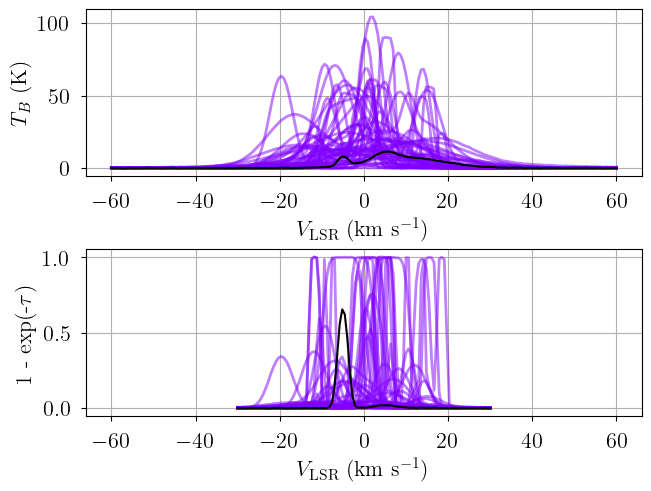

In [18]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=1000,  # prior predictive samples
)
axes = plot_predictive(model.data, prior.prior_predictive.sel(draw=slice(None, None, 20)))
axes.ravel()[1].sharex(axes.ravel()[0])

In [19]:
print(model.cloud_freeRVs)
print(model.cloud_deterministics)

['fwhm2_norm', 'log10_nHI_norm', 'velocity_norm', 'log10_n_alpha_norm', 'TB_fwhm_norm', 'tkin_factor_norm', 'filling_factor']
['fwhm2', 'log10_nHI', 'velocity', 'log10_n_alpha', 'TB_fwhm', 'tkin', 'tspin', 'tau_total', 'log10_Pth', 'log10_NHI', 'log10_depth']


['fwhm2', 'log10_nHI', 'velocity', 'log10_n_alpha', 'TB_fwhm', 'tkin', 'tspin', 'tau_total', 'log10_Pth', 'log10_NHI', 'log10_depth', 'filling_factor']


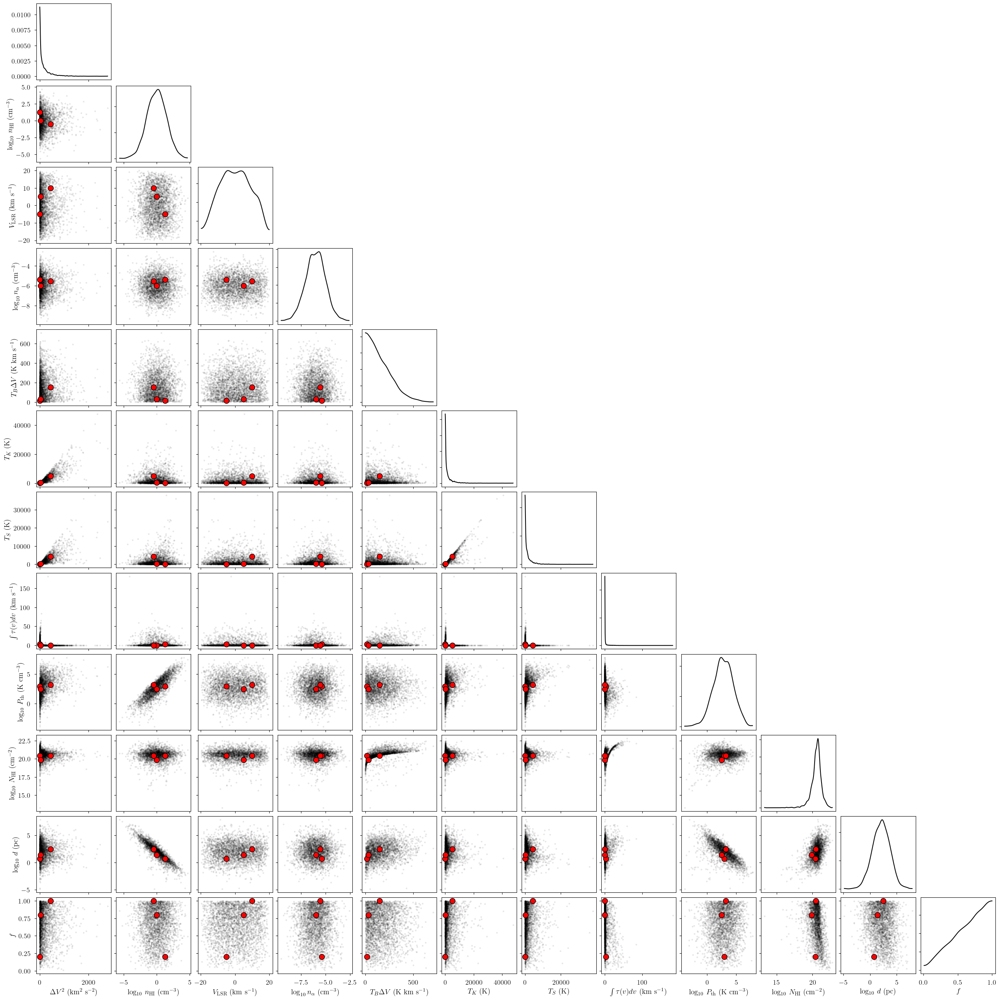

In [20]:
from bayes_spec.plots import plot_pair

var_names = model.cloud_deterministics + [p for p in model.cloud_freeRVs if "_norm" not in p]
print(var_names)
_ = plot_pair(
    prior.prior, # samples
    var_names, # var_names to plot
    combine_dims=["cloud"], # concatenate clouds
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=sim_params, # truths
)

## Variational Inference

In [25]:
start = time.time()
model.fit(
    n = 1_000_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.005, # VI relative convergence threshold
    abs_tolerance = 0.005, # VI absolute convergence threshold
    learning_rate = 0.001, # VI learning rate
    start = {"velocity_norm": np.linspace(0.1, 0.9, n_clouds)},
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 69400
Interrupted at 69,399 [6%]: Average Loss = 2.369e+05


Adding log-likelihood to trace


Output()

Runtime: 1.62 minutes


In [26]:
pm.summary(model.trace.posterior)

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_emission_norm[0],-0.166,0.071,-0.290,-0.029,0.002,0.002,1099.0,975.0,NaN
baseline_absorption_norm[0],0.253,0.101,0.082,0.458,0.003,0.002,889.0,907.0,NaN
log10_nHI_norm[0],0.781,0.547,-0.135,1.907,0.017,0.012,1026.0,950.0,NaN
log10_nHI_norm[1],0.050,1.039,-1.723,2.036,0.031,0.021,1113.0,1117.0,NaN
log10_nHI_norm[2],0.156,0.971,-1.741,1.954,0.034,0.024,829.0,766.0,NaN
log10_n_alpha_norm[0],0.330,0.885,-1.283,2.047,0.028,0.024,966.0,974.0,NaN
log10_n_alpha_norm[1],0.383,0.771,-1.188,1.739,0.024,0.017,1051.0,944.0,NaN
log10_n_alpha_norm[2],0.373,0.711,-0.874,1.763,0.023,0.016,984.0,974.0,NaN
fwhm2_norm[0],2.218,0.014,2.190,2.243,0.000,0.000,1130.0,651.0,NaN
fwhm2_norm[1],0.026,0.000,0.026,0.026,0.000,0.000,1084.0,982.0,NaN


Sampling: [absorption, emission]


Output()

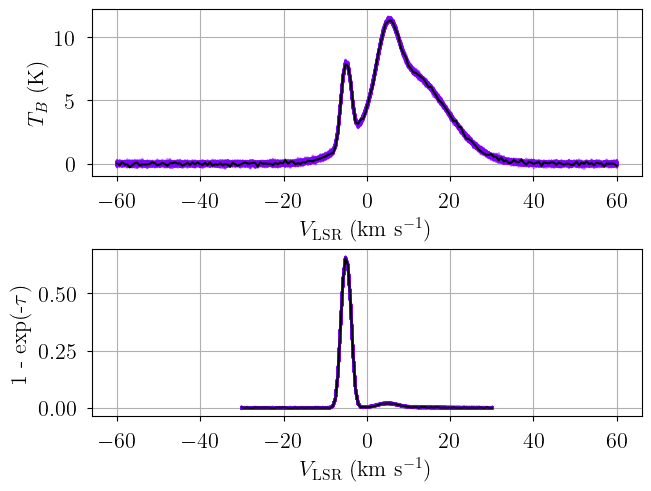

In [27]:
posterior = model.sample_posterior_predictive(
    thin=10,  # keep one in {thin} posterior samples
)
axes = plot_predictive(model.data, posterior.posterior_predictive)
axes.ravel()[1].sharex(axes.ravel()[0])

## Posterior Sampling: MCMC

In [28]:
start = time.time()
model.sample(
    init="advi+adapt_diag",  # initialization strategy
    tune=1000,  # tuning samples
    draws=1000,  # posterior samples
    chains=8,  # number of independent chains
    cores=8,  # number of parallel chains
    init_kwargs={
        "rel_tolerance": 0.005,
        "abs_tolerance": 0.005,
        "learning_rate": 0.001,
        "start": {"velocity_norm": np.linspace(0.1, 0.9, n_clouds)},
    },  # VI initialization arguments
    nuts_kwargs={"target_accept": 0.9},  # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 69400
Interrupted at 69,399 [6%]: Average Loss = 2.369e+05
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_emission_norm, baseline_absorption_norm, fwhm2_norm, log10_nHI_norm, velocity_norm, log10_n_alpha_norm, TB_fwhm_norm, tkin_factor_norm, filling_factor]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 355 seconds.


Adding log-likelihood to trace


Output()

Runtime: 7.62 minutes


In [31]:
model.solve(
    init_params="random_from_data", # GMM initialization strategy
    n_init=10, # number of GMM initilizations
    max_iter=1_000, # maximum number of GMM iterations
    kl_div_threshold=0.1, # covergence threshold
)

GMM converged to unique solution
7 of 8 chains appear converged.


In [32]:
print("solutions:", model.solutions)
az.summary(model.trace["solution_0"])
# this also works: az.summary(model.trace.solution_0)

solutions: [0]


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_emission_norm[0],-0.175,0.089,-0.343,-0.008,0.004,0.002,619.0,1289.0,1.01
baseline_absorption_norm[0],0.208,0.142,-0.047,0.489,0.005,0.003,695.0,1383.0,1.01
log10_nHI_norm[0],0.243,0.918,-1.477,2.017,0.042,0.022,474.0,892.0,1.02
log10_nHI_norm[1],-0.044,0.989,-1.986,1.742,0.031,0.018,1036.0,1791.0,1.00
log10_nHI_norm[2],0.054,0.976,-1.929,1.789,0.034,0.018,834.0,1402.0,1.01
log10_n_alpha_norm[0],0.323,0.992,-1.695,2.051,0.047,0.025,461.0,756.0,1.03
log10_n_alpha_norm[1],-0.022,0.991,-1.834,1.854,0.034,0.018,839.0,1380.0,1.01
log10_n_alpha_norm[2],0.037,0.957,-1.737,1.849,0.036,0.019,719.0,1264.0,1.02
fwhm2_norm[0],2.218,0.022,2.178,2.260,0.001,0.000,542.0,1217.0,1.01
fwhm2_norm[1],0.026,0.000,0.026,0.027,0.000,0.000,859.0,1249.0,1.00


Sampling: [absorption, emission]


Output()

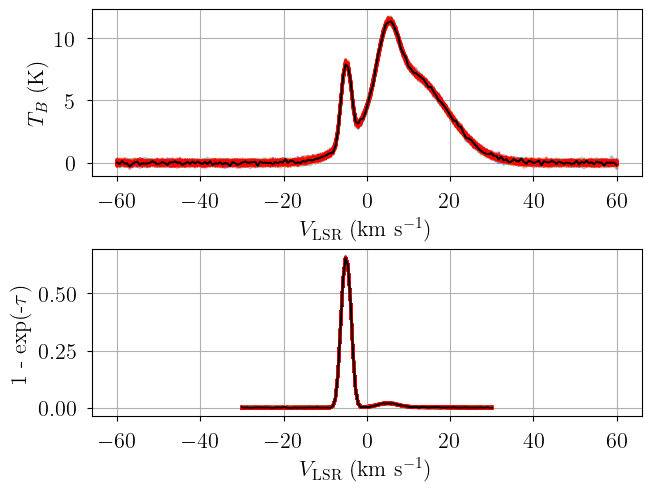

In [33]:
posterior = model.sample_posterior_predictive(
    thin=10,  # keep one in {thin} posterior samples
)
axes = plot_predictive(model.data, posterior.posterior_predictive)
axes.ravel()[0].sharex(axes.ravel()[1])

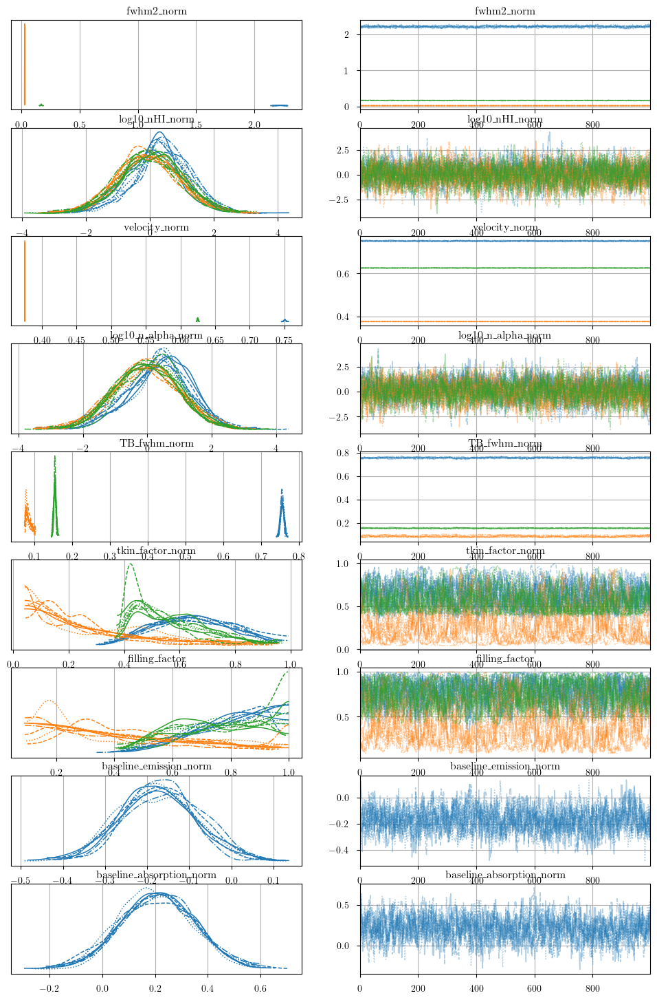

In [34]:
from bayes_spec.plots import plot_traces

_ = plot_traces(model.trace.posterior, model.cloud_freeRVs + model.baseline_freeRVs + model.hyper_freeRVs)

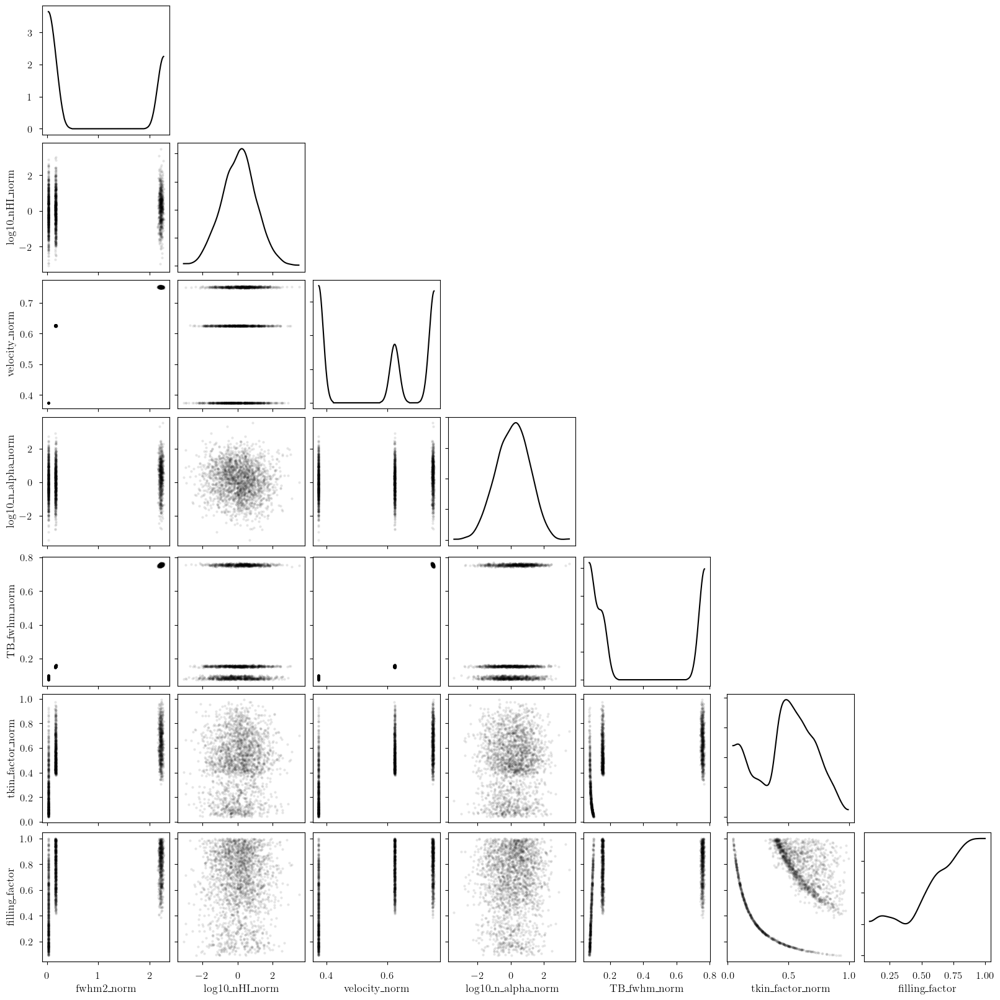

In [35]:
_ = plot_pair(
    model.trace.solution_0.sel(draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs, # var_names to plot
    combine_dims=["cloud"], # concatenate clouds
    kind="scatter", # plot type
)

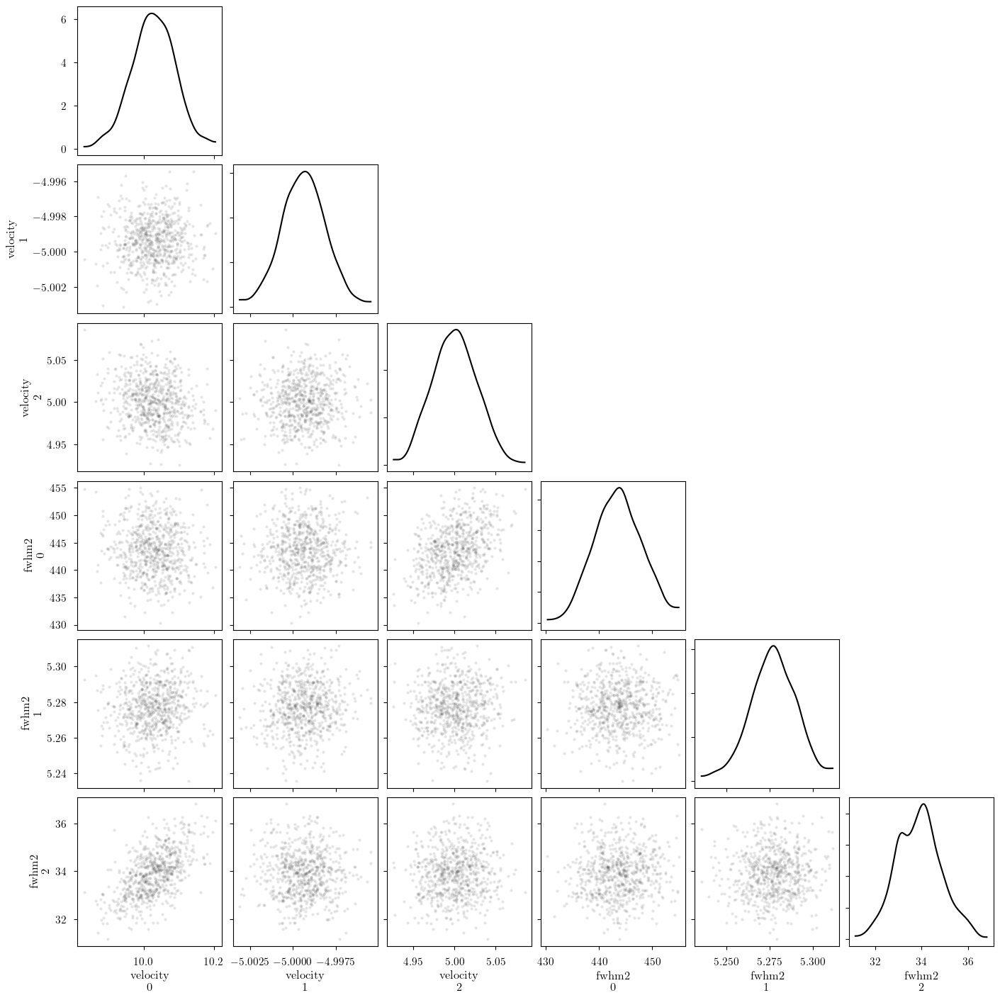

In [36]:
_ = plot_pair(
    model.trace.solution_0.sel(draw=slice(None, None, 10)), # samples
    ["velocity", "fwhm2"], # var_names to plot
    combine_dims=None, # do not concatenate clouds
    kind="scatter", # plot type
)

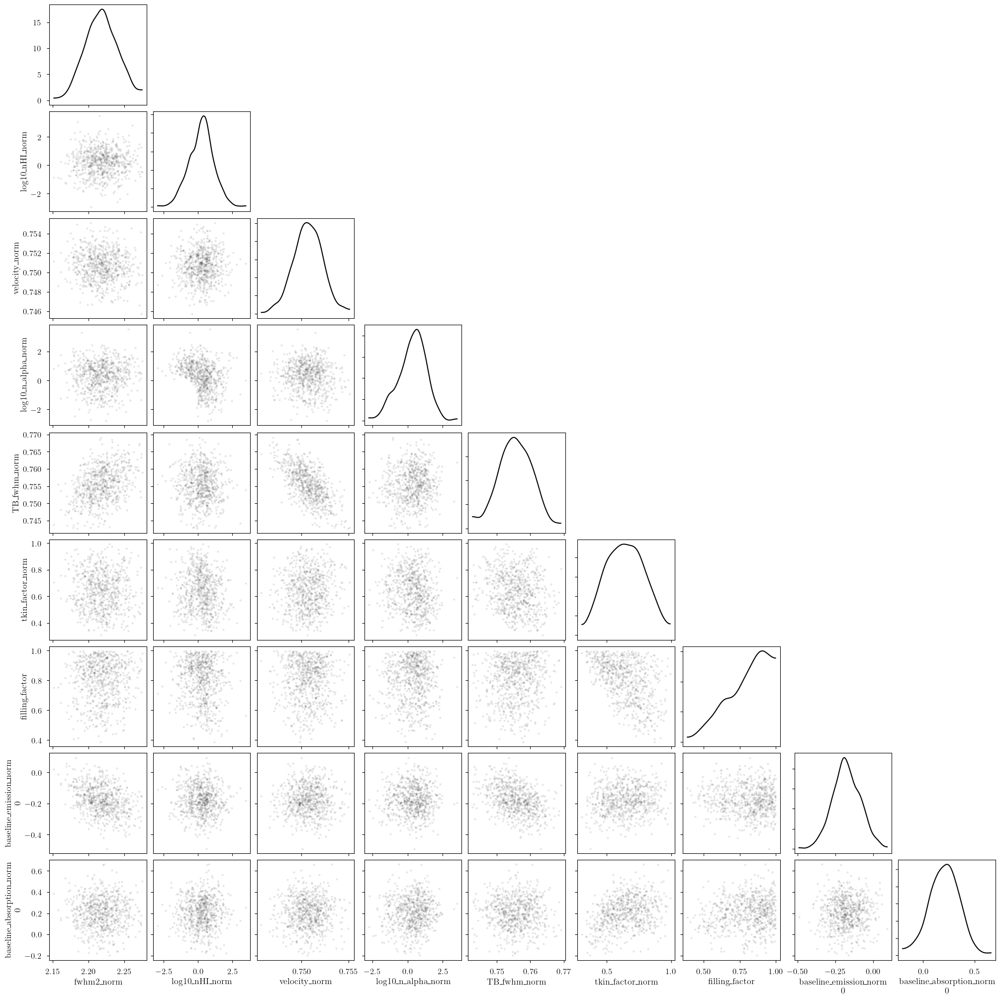

In [37]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0, draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs + model.hyper_freeRVs + model.baseline_freeRVs, # var_names to plot
    kind="scatter", # plot type
)

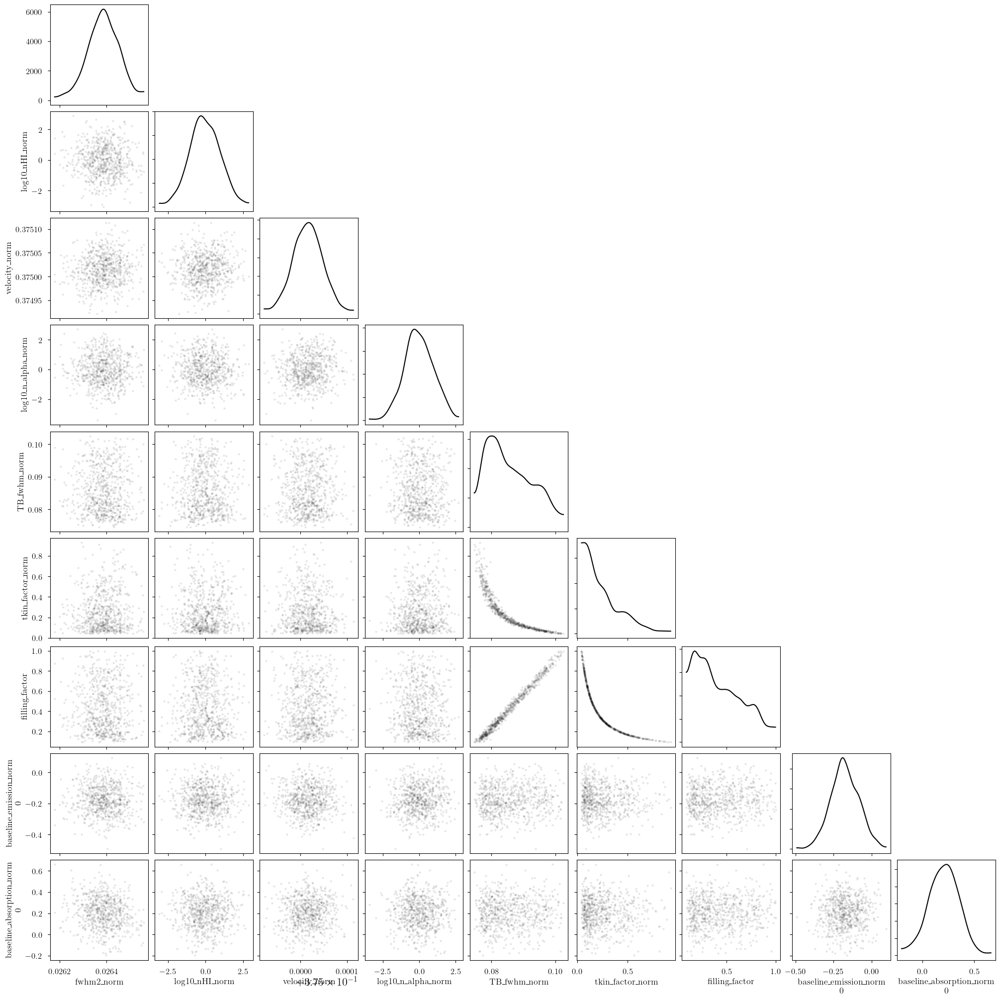

In [38]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=1, draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs + model.hyper_freeRVs + model.baseline_freeRVs, # var_names to plot
    kind="scatter", # plot type
)

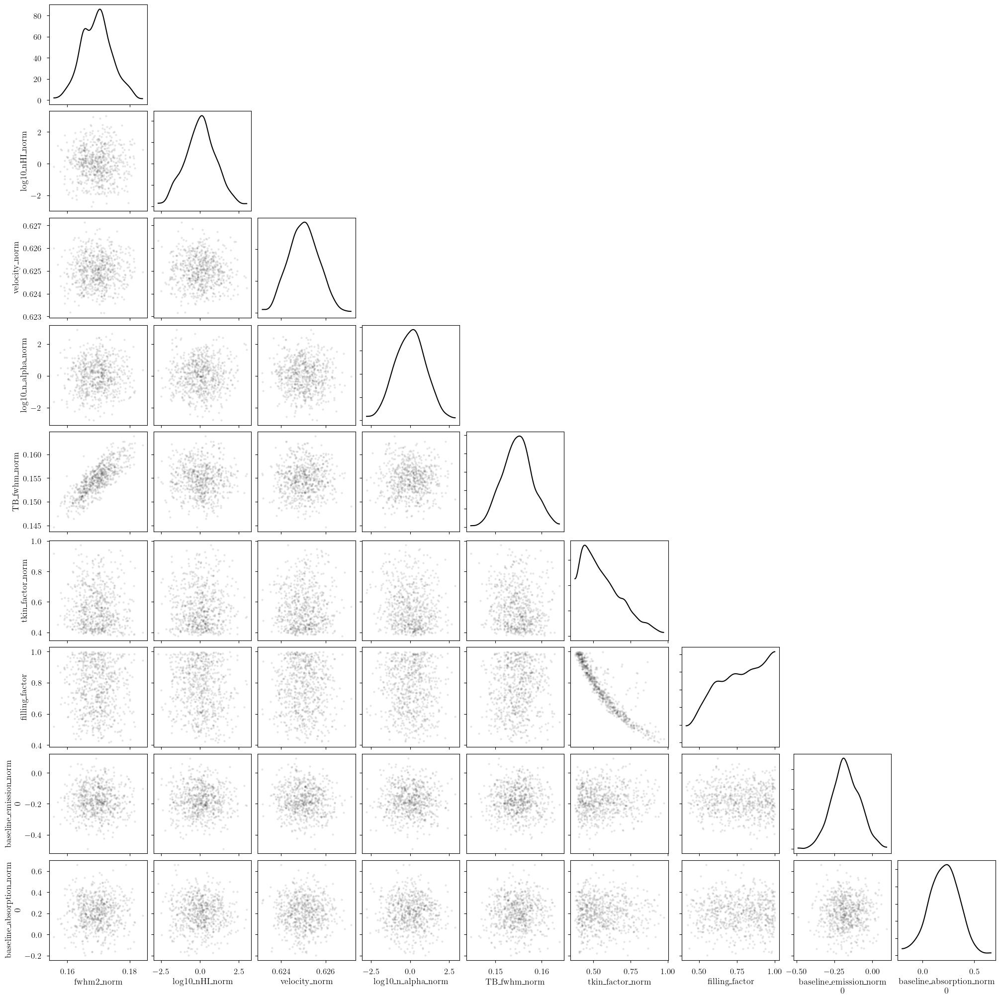

In [39]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=2, draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs + model.hyper_freeRVs + model.baseline_freeRVs, # var_names to plot
    kind="scatter", # plot type
)

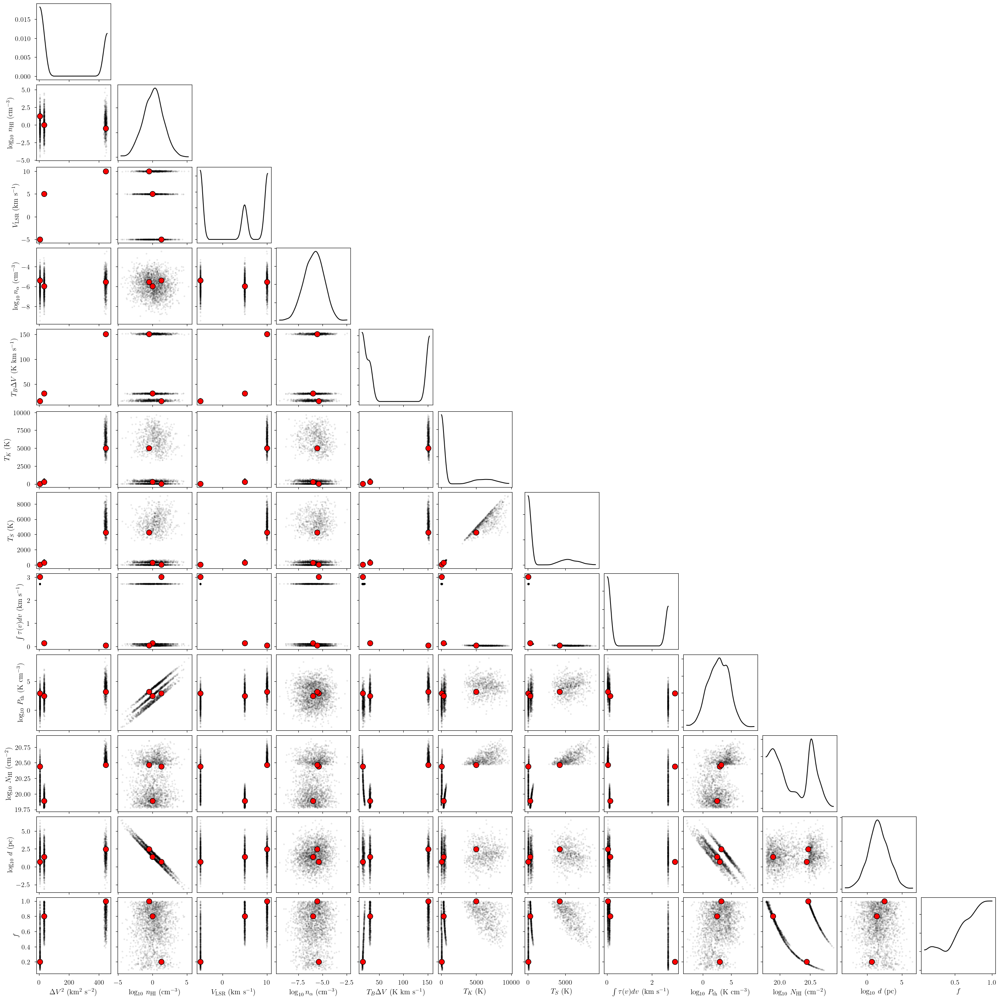

In [40]:
_ = plot_pair(
    model.trace.solution_0.sel(draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    combine_dims=["cloud"], # concatenate clouds
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=sim_params, # truths
)

In [41]:
# identify simulation cloud corresponding to each posterior cloud
sim_cloud_map = {}
for i in range(n_clouds):
    posterior_velocity = model.trace.solution_0['velocity'].sel(cloud=i).data.mean()
    match = np.argmin(np.abs(sim_params["velocity"] - posterior_velocity))
    sim_cloud_map[i] = match
sim_cloud_map

{0: np.int64(2), 1: np.int64(0), 2: np.int64(1)}

In [42]:
print("cloud freeRVs", model.cloud_freeRVs)
print("cloud deterministics", model.cloud_deterministics)
print("hyper freeRVs", model.hyper_freeRVs)
print("hyper deterministics", model.hyper_deterministics)

cloud freeRVs ['fwhm2_norm', 'log10_nHI_norm', 'velocity_norm', 'log10_n_alpha_norm', 'TB_fwhm_norm', 'tkin_factor_norm', 'filling_factor']
cloud deterministics ['fwhm2', 'log10_nHI', 'velocity', 'log10_n_alpha', 'TB_fwhm', 'tkin', 'tspin', 'tau_total', 'log10_Pth', 'log10_NHI', 'log10_depth']
hyper freeRVs []
hyper deterministics []


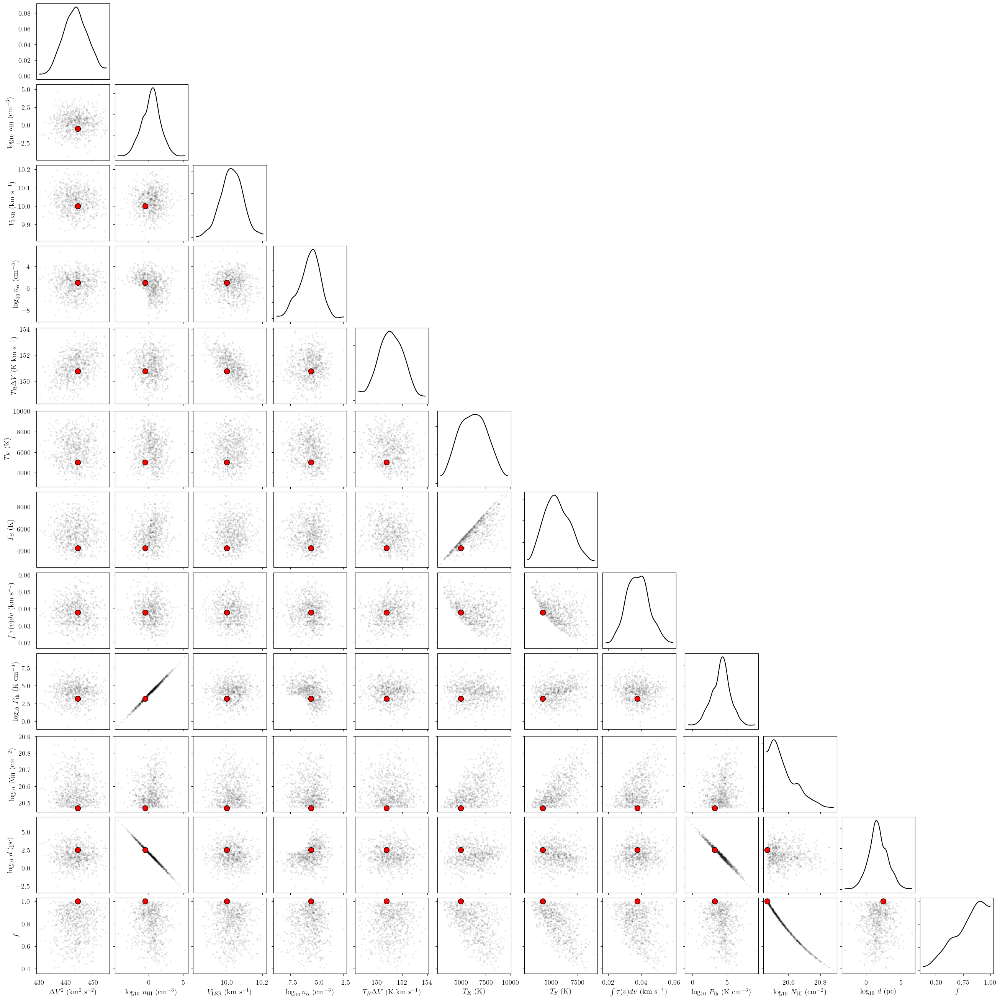

In [43]:
cloud = 0

# subset of sim_params
my_sim_params = {}
for var_name in var_names:
    my_sim_params[var_name] = sim_params[var_name][sim_cloud_map[cloud]]

_ = plot_pair(
    model.trace.solution_0.sel(cloud=cloud, draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=my_sim_params, # truths
)

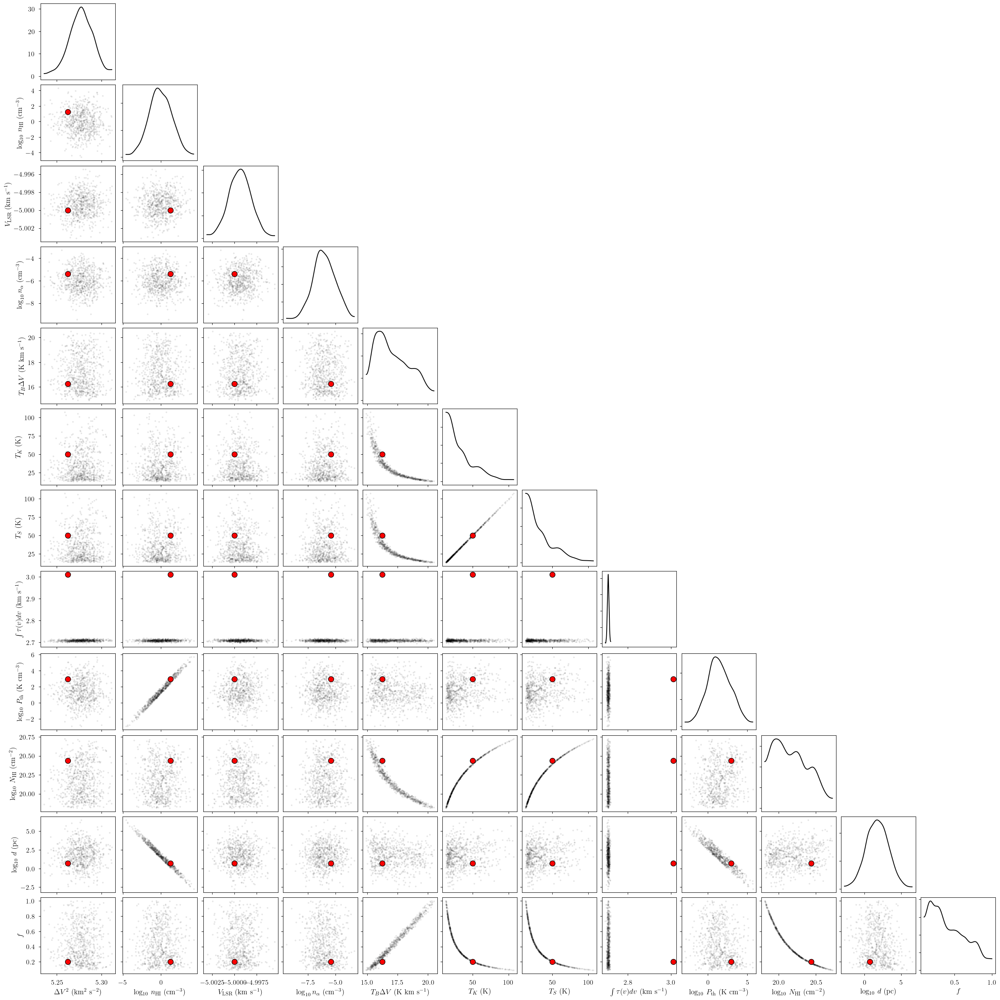

In [44]:
cloud = 1

# subset of sim_params
my_sim_params = {}
for var_name in var_names:
    my_sim_params[var_name] = sim_params[var_name][sim_cloud_map[cloud]]

_ = plot_pair(
    model.trace.solution_0.sel(cloud=cloud, draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=my_sim_params, # truths
)

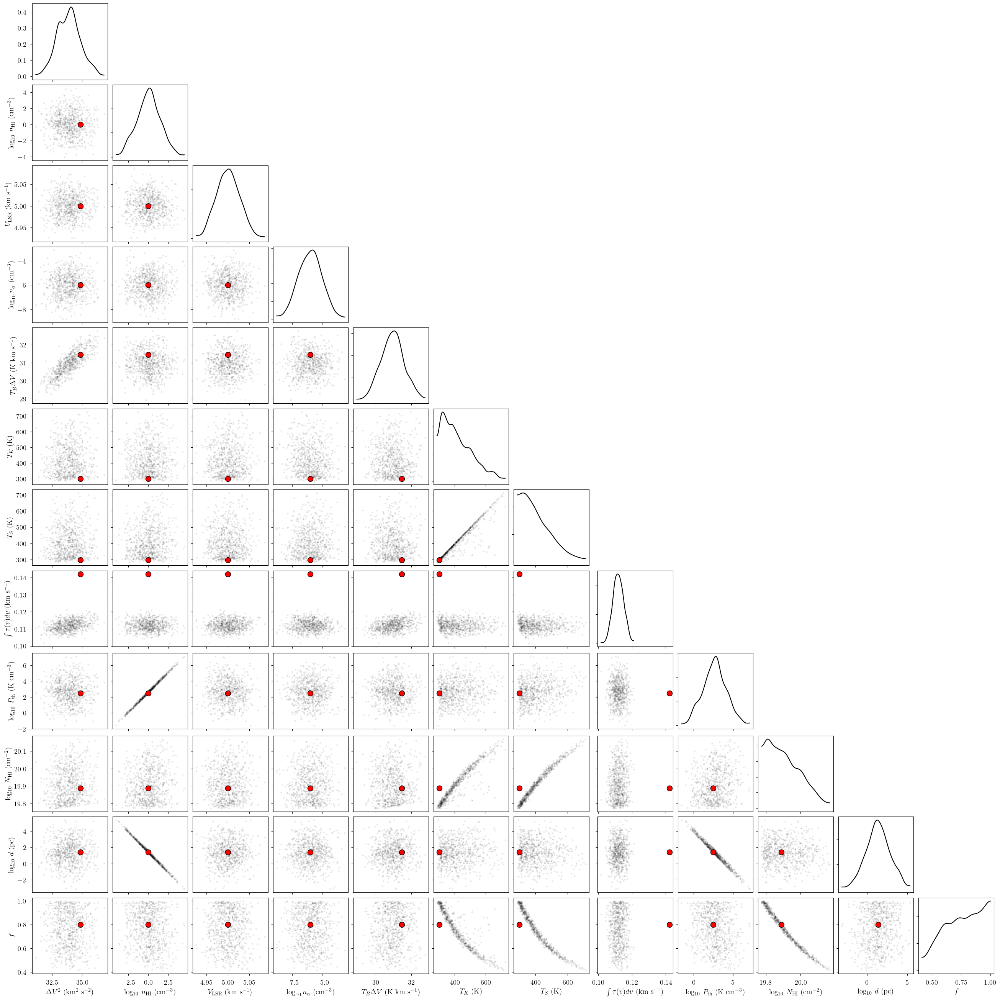

In [45]:
cloud = 2

# subset of sim_params
my_sim_params = {}
for var_name in var_names:
    my_sim_params[var_name] = sim_params[var_name][sim_cloud_map[cloud]]

_ = plot_pair(
    model.trace.solution_0.sel(cloud=cloud, draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=my_sim_params, # truths
)

In [46]:
point_stats = az.summary(model.trace.solution_0, kind="stats", hdi_prob=0.68)
print("BIC:", model.bic())
display(point_stats)

BIC: -1320.5678665470405


,mean,sd,hdi_16%,hdi_84%
baseline_emission_norm[0],-0.175,0.089,-0.265,-0.090
baseline_absorption_norm[0],0.208,0.142,0.065,0.344
log10_nHI_norm[0],0.243,0.918,-0.636,1.109
log10_nHI_norm[1],-0.044,0.989,-1.039,0.890
log10_nHI_norm[2],0.054,0.976,-0.825,1.097
log10_n_alpha_norm[0],0.323,0.992,-0.534,1.385
log10_n_alpha_norm[1],-0.022,0.991,-0.957,1.042
log10_n_alpha_norm[2],0.037,0.957,-0.942,0.957
fwhm2_norm[0],2.218,0.022,2.196,2.241
fwhm2_norm[1],0.026,0.000,0.026,0.026


Note the bias imposed by the assumption that the clouds have a constant column density. The spin temperature can be really be *less* than the "lower limit" that is typically derived by assuming `absorption_weight = 1` (i.e., that both the emission and absorption probe the same column density).